# Library Load

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
from scipy.stats import gmean
import seaborn as sns
import math
import matplotlib.pyplot as plt
import anndata as ad
import yaml
import rpy2
import holoviews as hv

# Setting paths

In [2]:
with open(yaml.full_load("../Paths.yaml")) as f:
    Paths = yaml.full_load(f)

baseDataPath = Paths["Paths"]["External"]
nucleiDS = ["TotalSeqA_nuclei", "CMO_nuclei"]
cellsDS = ["TotalSeqC_cells", "TotalSeqA_cells", "LMO_MULTseq_cells", "LMO_custom_cells"]
ds = "TotalSeqC_cells"



# Data import

In [3]:

adata = sc.read_h5ad(baseDataPath+"/DataByExp/"+ds+"/"+ds+".h5ad")
adata

AnnData object with n_obs × n_vars = 9229 × 33812
    var: 'gene_ids', 'feature_types'

In [4]:
# Here we separate HTO counts from GEX counts

HTOfeatures =  adata[:,adata.var["feature_types"] != "Gene Expression"].var_names.tolist()
HTOfeatures

HTOdf = pd.DataFrame(adata[:,HTOfeatures].X.todense(), index=adata.obs_names, columns=["HTO@TAG."+i for i in HTOfeatures])
#HTOdf = np.log1p(HTOdf.divide(HTOdf.apply(gmean, axis=1), axis = 0))



adata.obs = pd.concat([adata.obs,HTOdf], axis = 1)
adata.obs

# Keep only GEX
adata = adata[:,adata.var["feature_types"] == "Gene Expression"]

In [5]:
# Import demultiplexing results
GeneticID = pd.read_csv(baseDataPath+"/DataByExp/"+ds+"/"+ds+"_freemuxlet_MULTI_HTO_GMM_annotations.csv", sep ="\t", index_col=0, usecols=["cell","freemuxlet_BEST.GUESS","freemuxlet_DROPLET.TYPE"])
GeneticID.index = [i+"-1" for i in  GeneticID.index.tolist()]
adata.obs = pd.concat([adata.obs,GeneticID], axis = 1).loc[adata.obs_names]
adata.obs["freemuxlet_BEST.GUESS"] = np.where(adata.obs["freemuxlet_DROPLET.TYPE"] == "Singlet",adata.obs["freemuxlet_BEST.GUESS"],"Doublet")

# Quick view of unprocessed dataset

In [6]:
# Standard preprocesing

adata_tmp = adata.copy()

sc.pp.normalize_total(adata_tmp, target_sum=1e4)
sc.pp.log1p(adata_tmp)
sc.pp.highly_variable_genes(adata_tmp, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata_tmp.raw = adata_tmp


# PCA and UMAP
sc.tl.pca(adata_tmp, svd_solver='arpack')
sc.pp.neighbors(adata_tmp, n_neighbors=30, n_pcs=40)
sc.tl.umap(adata_tmp)

2022-11-28 17:58:16.521867: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-28 17:58:16.668774: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-11-28 17:58:18.238633: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/R/4.2.1/lib/R/lib:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/.singularity.d/li

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


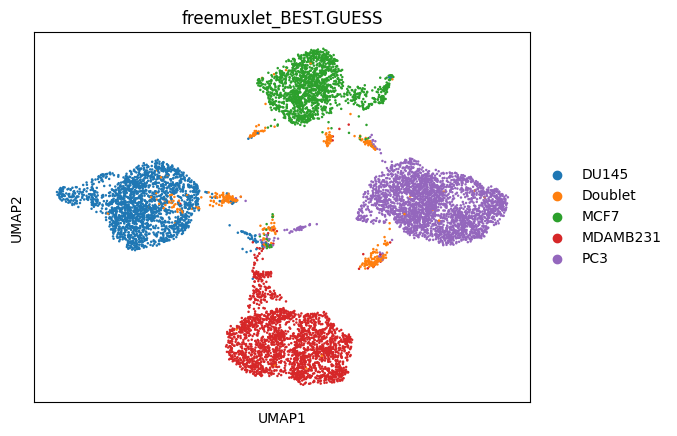

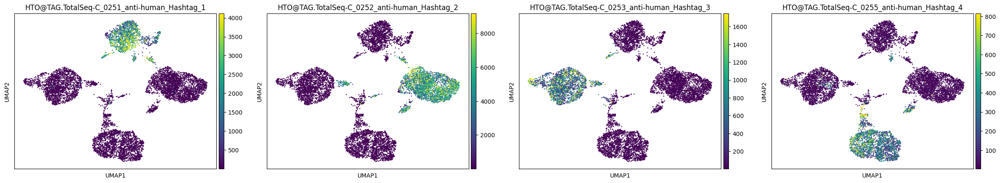

In [7]:
sc.pl.umap(adata_tmp, color=['freemuxlet_BEST.GUESS'], vmin='p1',vmax='p99')
sc.pl.umap(adata_tmp, color=[c for c in adata_tmp.obs.columns if "HTO@TAG." in c], vmin='p1',vmax='p99')

# Hashtag based deconvolution

for this purpose we export the HTO-only counts into R and launch MULTIseqDemux function

In [8]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
anndata2ri.activate()

In [9]:
%load_ext rpy2.ipython

In [10]:
htDF = adata.obs[[c for c in adata.obs.columns if "HTO@TAG." in c]]
htDFAdata = ad.AnnData(htDF.to_numpy(), obs=adata.obs)
htDFAdata.var_names = [c for c in adata.obs.columns if "HTO@TAG." in c]
htDFAdata.obs = htDFAdata.obs.drop(columns = [c for c in adata.obs.columns if "HTO@TAG." in c])

In [11]:
%%R -i htDFAdata

library(Seurat)

Sobj <- as.Seurat(htDFAdata, counts = "X", data = NULL)
Sobj
Sobj[["HTO"]] <- CreateAssayObject(counts = GetAssayData(object = Sobj, slot = "counts"))
Sobj <- NormalizeData(Sobj,assay = "HTO", normalization.method = "CLR")
Sobj <- MULTIseqDemux(Sobj, assay = "HTO",autoThresh = TRUE)




    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
     |                                                  | 0 % ~calculating   |+++++++++++++                                     | 25% ~00s           |+++++++++++++++++++++++++                         | 50% ~00s           |++++++++++++++++++++++++++++++++++++++            | 75% ~00s           |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=00s  


In [12]:
%%R -o TagsID

TagsID <- data.frame(
                          (lapply(Sobj@meta.data[,c("MULTI_ID","MULTI_classification")], function(x){gsub("-", "_", x)})),
                          row.names = rownames(Sobj@meta.data)
                         )


# Import TAGs deconvolution results into original adata

In [13]:
try:
    adata.obs = adata.obs.drop(columns="MULTI_ID")
except:
    print("MULTI_ID obs not found")

TagsID = TagsID[["MULTI_ID"]]
adata.obs = pd.concat([adata.obs,TagsID], axis = 1)

# Here we map tag name with best freemuxlet overlap correspondent
MapDict = dict(pd.crosstab(adata.obs.loc[~adata.obs["MULTI_ID"].isin(["Negative","Doublet"]),"MULTI_ID"], adata.obs.loc[~adata.obs["MULTI_ID"].isin(["Negative","Doublet"]),"freemuxlet_BEST.GUESS"]).idxmax(axis = 1))
print(MapDict)
adata.obs["MULTI_ID"] = adata.obs["MULTI_ID"].replace(MapDict)+"_HTO"

MULTI_ID obs not found
{'HTO@TAG.TotalSeq_C_0251_anti_human_Hashtag_1': 'MCF7', 'HTO@TAG.TotalSeq_C_0252_anti_human_Hashtag_2': 'PC3', 'HTO@TAG.TotalSeq_C_0253_anti_human_Hashtag_3': 'DU145', 'HTO@TAG.TotalSeq_C_0255_anti_human_Hashtag_4': 'MDAMB231'}


# Basic Filtering

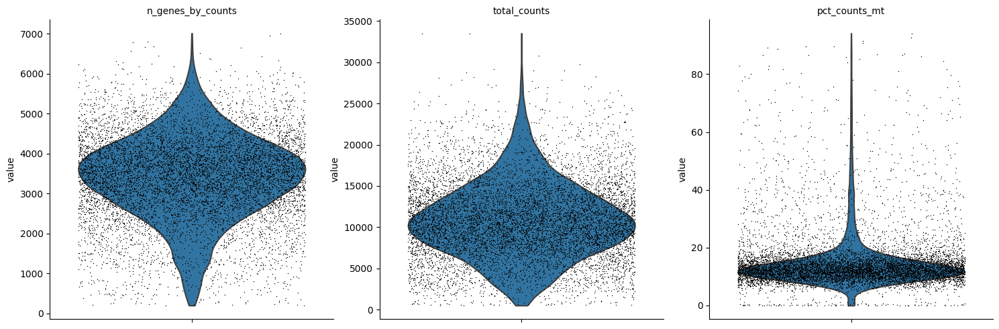

Only cells with pct mito between 3 and 22 will be kept
Ncells: Pre filter 9223 vs post filter 8240


In [14]:
# Remove cells with less than 200 counts
sc.pp.filter_cells(adata, min_genes=200)


# filter on max mito genes %
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
adata

# MAD-based filtering
MAD = abs(adata.obs["pct_counts_mt"] - adata.obs["pct_counts_mt"].median()).sum() / adata.shape[0]
print("Only cells with pct mito between {} and {} will be kept".format(round(adata.obs["pct_counts_mt"].median() - 2*MAD), round(adata.obs["pct_counts_mt"].median() + 2*MAD)))
print("Ncells: Pre filter {} vs post filter {}".format(adata.shape[0],
                                               adata[(adata.obs["pct_counts_mt"] >= adata.obs["pct_counts_mt"].median() - 2*MAD) & (adata.obs["pct_counts_mt"] <= adata.obs["pct_counts_mt"].median() + 2*MAD)].shape[0]))

adata = adata[(adata.obs["pct_counts_mt"] >= adata.obs["pct_counts_mt"].median() - 2*MAD) & (adata.obs["pct_counts_mt"] <= adata.obs["pct_counts_mt"].median() + 2*MAD)]

# Here we logCenter also hashtag counts in obs column for visualization

In [15]:
# Firstwe replace 0 with 1
HTOdf.loc[(HTOdf == 0).values.any(axis = 1)] = HTOdf[(HTOdf == 0).values.any(axis = 1)].apply(lambda row: row.replace({0:1}))
CLR_htos =  np.log(HTOdf.divide(HTOdf.apply(gmean, axis=1), axis = 0))
#CLR_htos = CLR_htos.fillna(0)
for col in [c for c in adata.obs.columns if "HTO@TAG." in c]:
    adata.obs[col] = CLR_htos[col]


/tmp/ipykernel_35134/2419446567.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[col] = CLR_htos[col]


# Dimensionality reduction on properly processed data

In [16]:
# Standard preprocesing


sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.raw = adata


# PCA and UMAP
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=40)
sc.tl.umap(adata)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


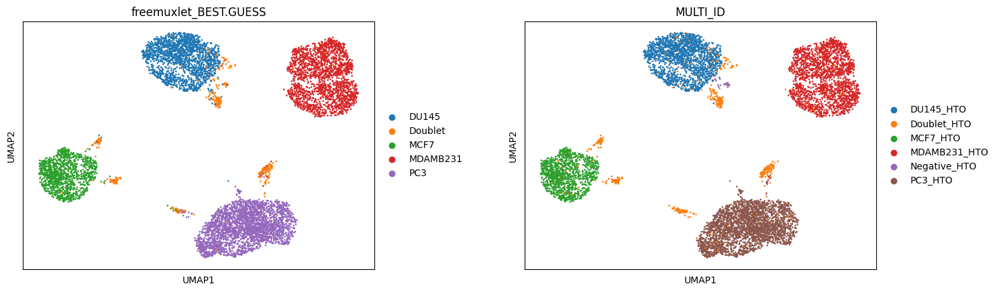

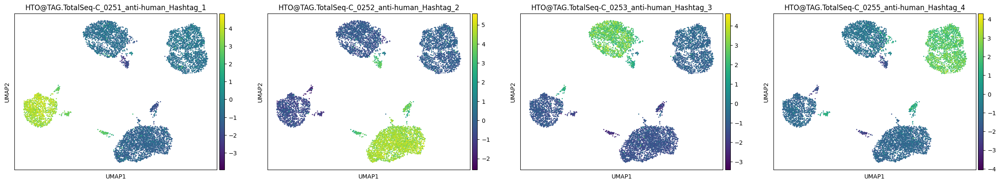

In [17]:
sc.pl.umap(adata, color=['freemuxlet_BEST.GUESS',"MULTI_ID"], vmin='p1',vmax='p99', wspace=.3)
sc.pl.umap(adata, color=[c for c in adata_tmp.obs.columns if "HTO@TAG." in c])

# TAGs expression comparison

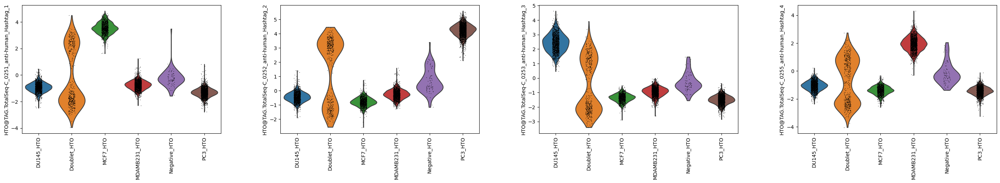

In [18]:
sc.pl.violin(adata, keys=[c for c in adata.obs.columns if "HTO@TAG." in c], groupby='MULTI_ID', rotation=90)

{'HTO@TAG.TotalSeq_C_0251_anti_human_Hashtag_1': 'MCF7', 'HTO@TAG.TotalSeq_C_0252_anti_human_Hashtag_2': 'PC3', 'HTO@TAG.TotalSeq_C_0253_anti_human_Hashtag_3': 'DU145', 'HTO@TAG.TotalSeq_C_0255_anti_human_Hashtag_4': 'MDAMB231'}


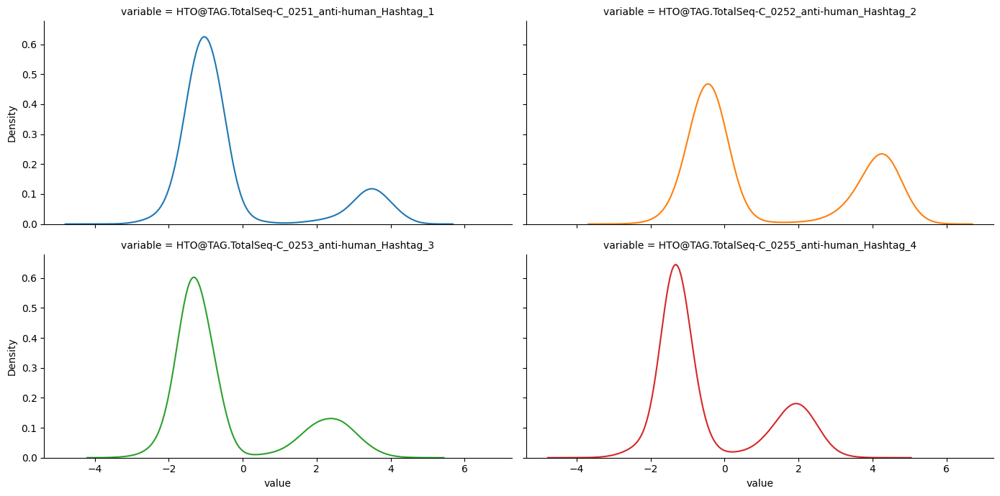

In [19]:
g = sns.FacetGrid(adata.obs[[c for c in adata.obs.columns if "HTO@TAG." in c]].melt(), col="variable",hue="variable",height=3.5, aspect=2, col_wrap=2)
g.map(sns.kdeplot, "value")
print(MapDict)

# Assignment Distribution exploration

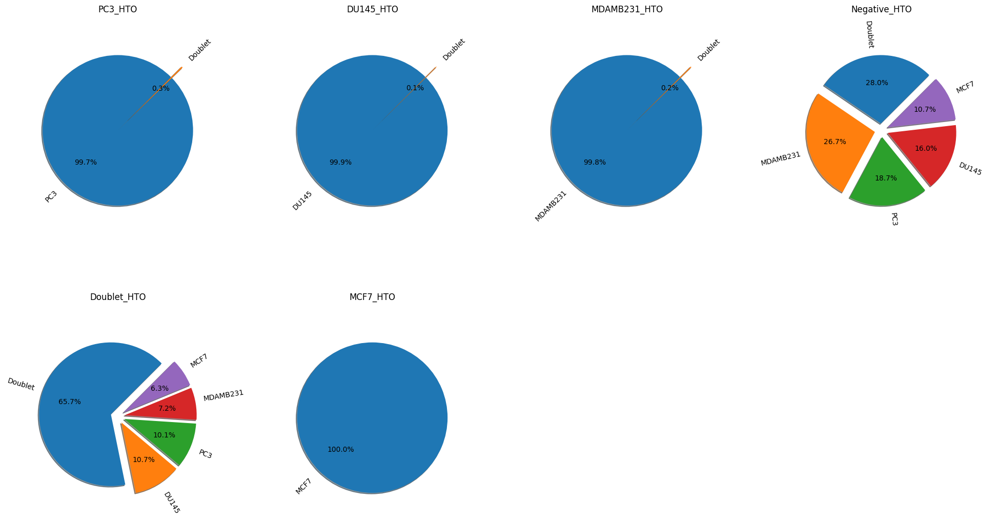

In [20]:
nrow, ncol = math.ceil(len(adata.obs["MULTI_ID"].unique())/4), 4
axs = [(r,c) for r in range(0, nrow) for c in range(0, ncol) ]
figsize = (ncol*5, nrow*4.7)  #(width, height)
#Set axes
fig, ax = plt.subplots(nrows=nrow, ncols=ncol, figsize=figsize)
fig.tight_layout(pad=1, h_pad=15)   #space between plots

for i in axs[-(len(adata.obs["MULTI_ID"].unique())%4):]:
    fig.delaxes(ax[i])

#Plot
for n,i in enumerate(adata.obs["MULTI_ID"].unique()):
    adataID = adata[adata.obs["MULTI_ID"] == i]
    
    labels = adataID.obs["freemuxlet_BEST.GUESS"].value_counts().index.tolist()
    sizes = adataID.obs["freemuxlet_BEST.GUESS"].value_counts().tolist()
    myexplode =  tuple([0.2]*len(labels))

    ax[axs[n]].pie(sizes, radius=2,explode=myexplode,labels=labels, autopct='%1.1f%%',
            shadow=True, startangle=45,rotatelabels=90 )
    ax[axs[n]].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    ax[axs[n]].set_title(i,pad=50)    


# Categories assignment overlap

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
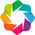

:Sankey   [freemuxlet_BEST.GUESS,MULTI_ID]   (count)

In [21]:
obsTupleToMap = ('freemuxlet_BEST.GUESS',"MULTI_ID")
SankeyDF=adata.obs[list(obsTupleToMap)]
SankeyDF.columns = [obsTupleToMap[0],obsTupleToMap[1]]
SankeyDF = SankeyDF.groupby([obsTupleToMap[0],obsTupleToMap[1]]).size().reset_index().rename(columns={0:'count'})
SankeyDF=SankeyDF[SankeyDF["count"] != 0]
hv.extension('bokeh')

SankeyDF = SankeyDF.sort_values("count", ascending = False)
sankey1 = hv.Sankey(SankeyDF, kdims=[obsTupleToMap[0],obsTupleToMap[1]], vdims="count")


sankey1.opts(label_position='outer',
edge_color=obsTupleToMap[0], edge_line_width=0,
node_alpha=1.0, node_width=40, node_sort=False,
width=1100, height=700, bgcolor="white")

# Accuracy calculaiton

In [22]:
SingletsDF = adata.obs.loc[(adata.obs["freemuxlet_DROPLET.TYPE"] == "Singlet") & (~adata.obs["MULTI_ID"].isin(["Negative_HTO","Doublet_HTO"])),["MULTI_ID","freemuxlet_BEST.GUESS"]]
SingletsDF.MULTI_ID = SingletsDF.MULTI_ID.str.replace("_HTO", "")
MathingSNGS=(SingletsDF["MULTI_ID"] == SingletsDF["freemuxlet_BEST.GUESS"]).sum()
MathingSNGS

NonSingletsDF = adata.obs.loc[(adata.obs["freemuxlet_DROPLET.TYPE"] != "Singlet") & (adata.obs["MULTI_ID"].isin(["Negative_HTO","Doublet_HTO"])),["MULTI_ID","freemuxlet_BEST.GUESS"]]
NonSingletsDF.MULTI_ID = NonSingletsDF.MULTI_ID.str.replace("_HTO", "")
MathingNonSNGS=(NonSingletsDF["MULTI_ID"] == NonSingletsDF["freemuxlet_BEST.GUESS"]).sum()
MathingNonSNGS

(MathingSNGS+MathingNonSNGS)/adata.shape[0]

0.9674757281553398